In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
import numpy as np
from tqdm import tqdm
from pathlib import Path
import openslide
import pandas as pd

In [4]:
from fastai.callbacks.csv_logger import CSVLogger

In [5]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.helper.wsi_loader import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric, PascalVOCMetricByDistance

In [6]:
slides_train = ["2707_20 TB BAL Human neu.svs", 
                         "11480_19 humane BAL Berliner Blau.svs", 
                         "10080_19 humane BAL Berliner Blau-001.svs", 
                         "10052_19 humane BAL Berliner Blau-001.svs", 
                         "10120_19 humane BAL Berliner Blau.svs" 
                        ]

slides_val = ["27_EIPH_571557 Turnbull blue.svs", "17_EIPH_575796 Berliner Blau.svs"]

In [7]:
grade_list = [0, 1]
annotations_path = Path("../../Statistics/SDATA_Final_Annotations.pkl")
annotations = pd.read_pickle(annotations_path)
annotations["image_name"] = [name.replace("tiff","svs") for name in annotations["image_name"]]
annotations = annotations[annotations["grade"].isin(grade_list)]
annotations_train = annotations[annotations["image_name"].isin(slides_train)]
annotations_val = annotations[annotations["image_name"].isin(slides_val)]
annotations_train.head()

,id,image_id,image_set,species,image_name,image_type,grade,vector,unique_identifier,user_id,deleted,last_editor,data_set_name,version
139421,2219209,3622,251,human,2707_20 TB BAL Human neu.svs,TurnbullBlue,0,"{'x1': 11061, 'x2': 11239, 'y1': 15500, 'y2': ...",eee6bb47-8825-4de6-939a-92d35e07485b,1,False,1,SDATA,Inference
139422,2219210,3622,251,human,2707_20 TB BAL Human neu.svs,TurnbullBlue,0,"{'x1': 7575, 'x2': 7722, 'y1': 11417, 'y2': 11...",5aa682e3-1417-4104-b3ab-41d316662e4f,1,False,1,SDATA,Inference
139423,2219211,3622,251,human,2707_20 TB BAL Human neu.svs,TurnbullBlue,0,"{'x1': 11418, 'x2': 11583, 'y1': 13947, 'y2': ...",4ac20d34-177e-4e30-97a4-16a26372b39f,1,False,1,SDATA,Inference
139424,2219212,3622,251,human,2707_20 TB BAL Human neu.svs,TurnbullBlue,0,"{'x1': 19568, 'x2': 19753, 'y1': 20871, 'y2': ...",4364a598-cd6a-4c27-b09b-f4503e44bc61,1,False,1,SDATA,Inference
139425,2219213,3622,251,human,2707_20 TB BAL Human neu.svs,TurnbullBlue,0,"{'x1': 7516, 'x2': 7674, 'y1': 11404, 'y2': 11...",5e8f8297-6453-4c1f-8585-8462b016f9ab,1,False,1,SDATA,Inference


In [8]:
slides_path = Path("../../../Slides")
files = {slide.name: slide for slide in slides_path.rglob("*.svs")  if slide.name in slides_train + slides_val}
files

{'10052_19 humane BAL Berliner Blau-001.svs': PosixPath('../../../Slides/Human/10052_19 humane BAL Berliner Blau-001.svs'),
 '10080_19 humane BAL Berliner Blau-001.svs': PosixPath('../../../Slides/Human/10080_19 humane BAL Berliner Blau-001.svs'),
 '10120_19 humane BAL Berliner Blau.svs': PosixPath('../../../Slides/Human/10120_19 humane BAL Berliner Blau.svs'),
 '11480_19 humane BAL Berliner Blau.svs': PosixPath('../../../Slides/Human/11480_19 humane BAL Berliner Blau.svs'),
 '17_EIPH_575796 Berliner Blau.svs': PosixPath('../../../Slides/Equine/17_EIPH_575796 Berliner Blau.svs'),
 '2707_20 TB BAL Human neu.svs': PosixPath('../../../Slides/Human/2707_20 TB BAL Human neu.svs'),
 '27_EIPH_571557 Turnbull blue.svs': PosixPath('../../../Slides/Equine/27_EIPH_571557 Turnbull blue.svs')}

In [9]:
size = 1024 
level = 0
bs = 16
train_images = 2500
val_images = 1500
experiment_name = "HumanVsEquine"

In [10]:
train_files = []
val_files = []

for image_name in annotations_train["image_name"].unique():
    
    annotations = annotations_train[annotations_train["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    train_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
for image_name in annotations_val["image_name"].unique():
    
    annotations = annotations_val[annotations_val["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]

    val_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
train_files = list(np.random.choice(train_files, train_images))
valid_files = list(np.random.choice(val_files, val_images))

In [11]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      #max_rotate=90,
                      max_lighting=0.0,
                      max_zoom=1.,
                      max_warp=0.0,
                      p_affine=0.5,
                      p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )
tfms

([RandTransform(tfm=TfmCrop (crop_pad), kwargs={'row_pct': (0, 1), 'col_pct': (0, 1), 'padding_mode': 'reflection'}, p=1.0, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmAffine (dihedral_affine), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmAffine (rotate), kwargs={'degrees': (-10.0, 10.0)}, p=0.5, resolved={}, do_run=True, is_random=True, use_on_y=True)],
 [RandTransform(tfm=TfmCrop (crop_pad), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True, use_on_y=True)])

In [12]:
def get_y_func(x):
    return x.y

In [13]:
train =  ObjectItemListSlide(train_files, path=slides_path)
valid = ObjectItemListSlide(valid_files, path=slides_path)
item_list = ItemLists(slides_path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate).normalize()

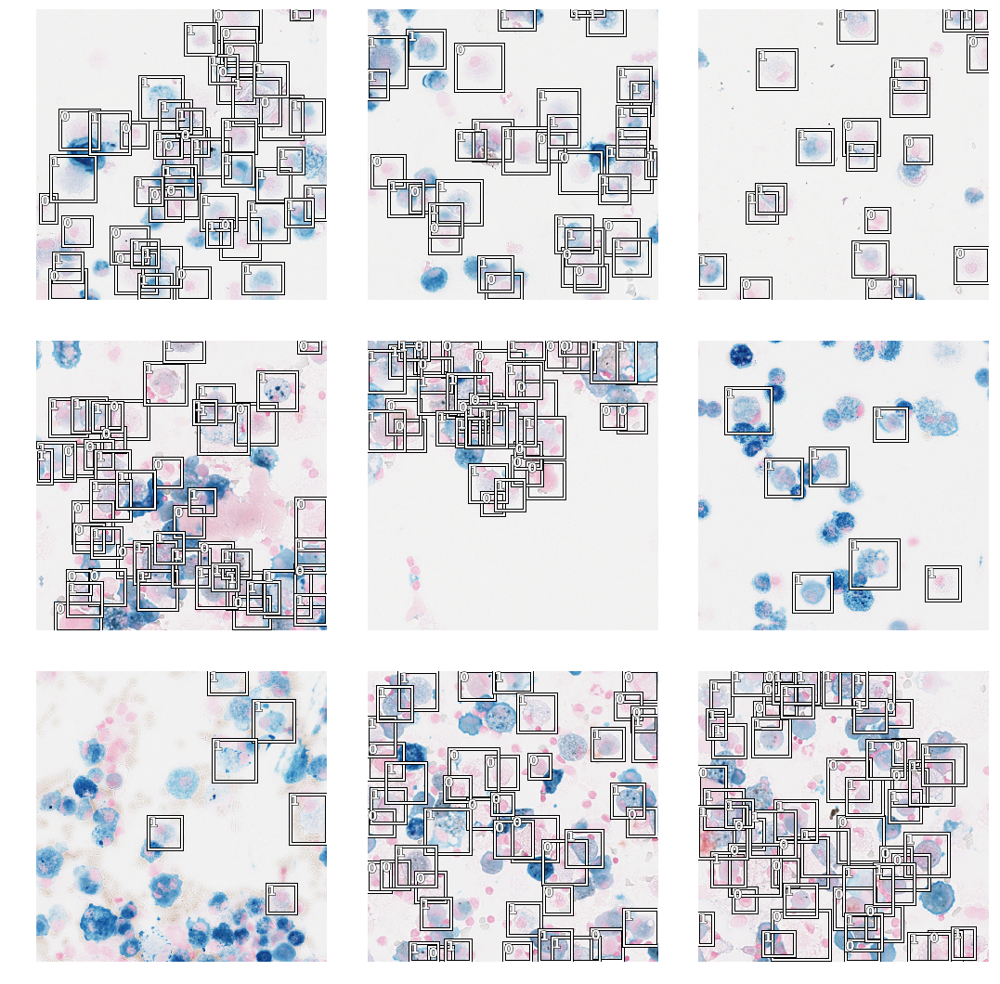

In [14]:
data.show_batch(rows=3, ds_type=DatasetType.Train, figsize=(15,15))

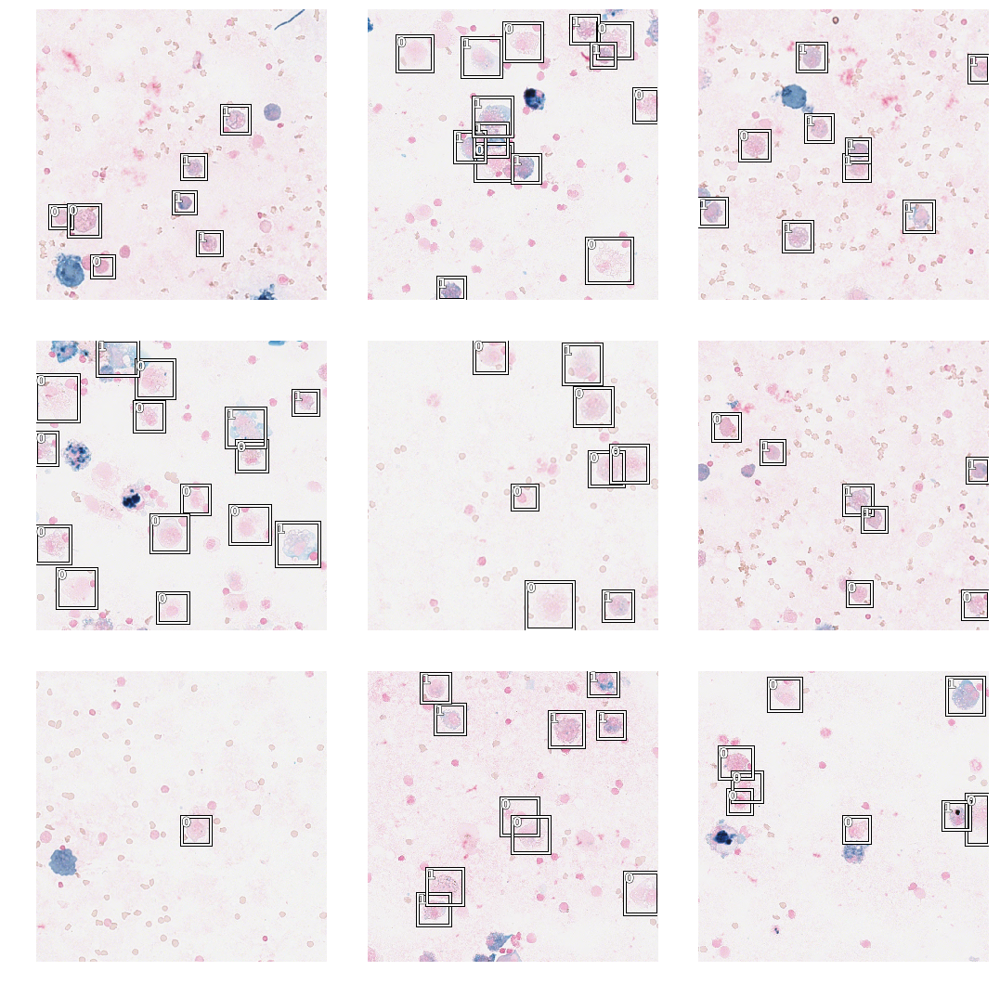

In [15]:
data.show_batch(rows=3, ds_type=DatasetType.Valid, figsize=(15,15))

In [16]:
anchors = create_anchors(sizes=[(32,32)], ratios=[1], scales=[0.6, 0.7, 0.9, 1.25, 1.5])

In [17]:
crit = RetinaNetFocalLoss(anchors)
encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=5, sizes=[32], chs=128, final_bias=-4., n_conv=3)

In [18]:
voc = PascalVOCMetricByDistance(anchors, size, [str(i) for i in data.train_ds.y.classes[1:]], radius=40)
learn = Learner(data, model, loss_func=crit, callback_fns=[BBMetrics, partial(CSVLogger, append=False, filename=experiment_name)], #BBMetrics, ShowGraph
                metrics=[voc]
               )

In [19]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

In [20]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-0,AP-1,time
0,0.519121,0.448886,0.588098,0.117059,0.331827,0.560648,0.615548,08:31
1,0.342306,0.397594,0.709891,0.064011,0.333583,0.712865,0.706917,05:12
2,0.368916,0.381955,0.649741,0.085530,0.296426,0.544037,0.755444,05:37
3,0.285547,0.305573,0.739765,0.055738,0.249835,0.648474,0.831057,04:50
4,0.243931,0.260991,0.667673,0.050019,0.210973,0.677907,0.657438,04:41
5,0.230673,0.204890,0.783669,0.042528,0.162362,0.750500,0.816837,04:37
6,0.181334,0.198849,0.788209,0.041369,0.157480,0.741651,0.834768,04:36
7,0.167609,0.196186,0.779277,0.035250,0.160935,0.755790,0.802765,04:38
8,0.159280,0.204659,0.791486,0.036984,0.167675,0.755449,0.827523,04:38
9,0.145981,0.183593,0.813321,0.033961,0.149631,0.776326,0.850315,04:41


In [21]:
import pickle

stats = {"anchors": anchors,
         "mean": to_np(data.stats[0]),
         "std": to_np(data.stats[1]),
         "size": size,
         "n_classes": 6,
         "n_anchors": 5,
         "sizes": [32],
         "chs": 128,
         "encoder": "RN-18",
         "n_conv": 3,
         "level": 0,
         "model": get_model(learn.model).state_dict()
        }

torch.save(stats, "{}.p".format(experiment_name))

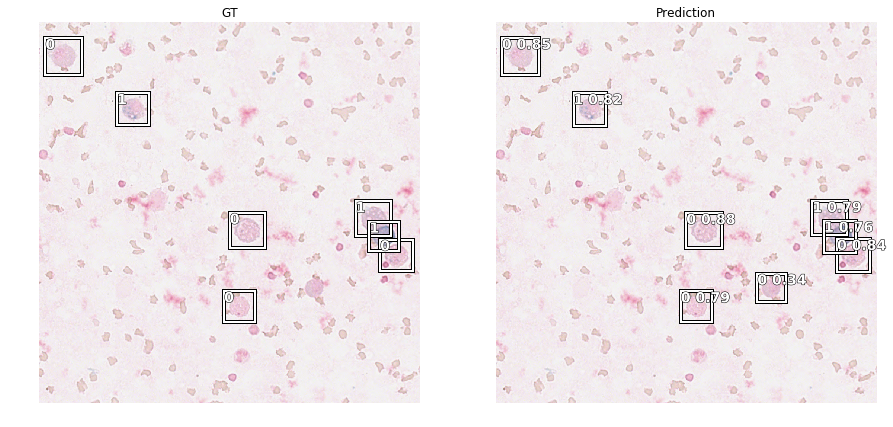

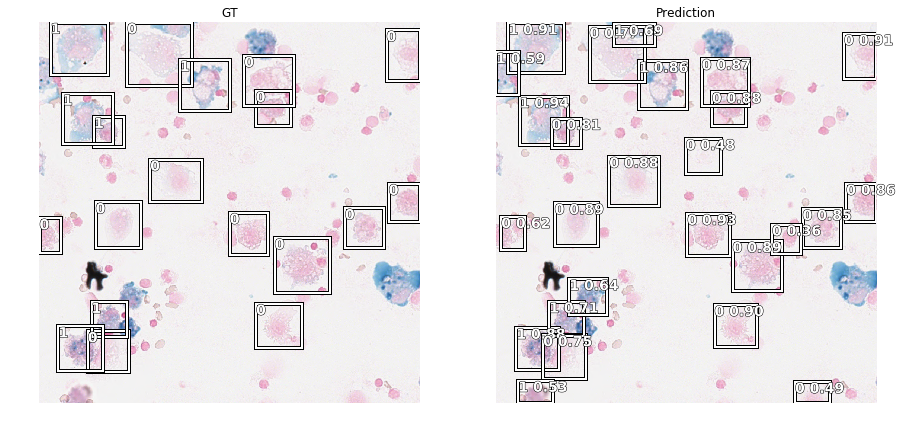

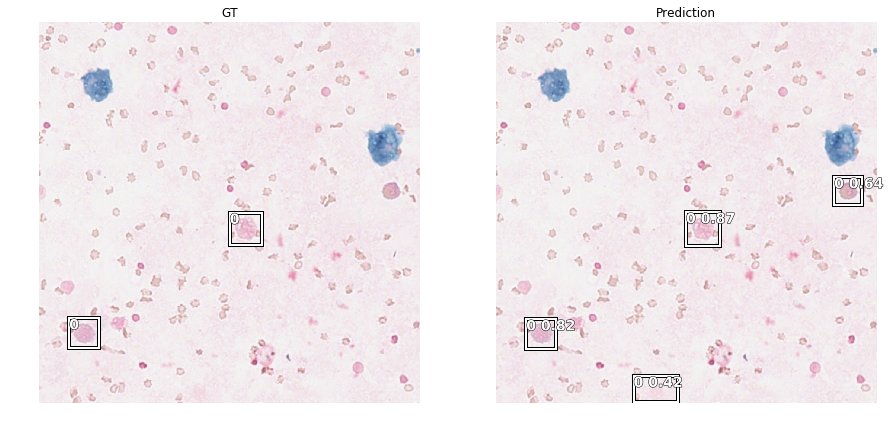

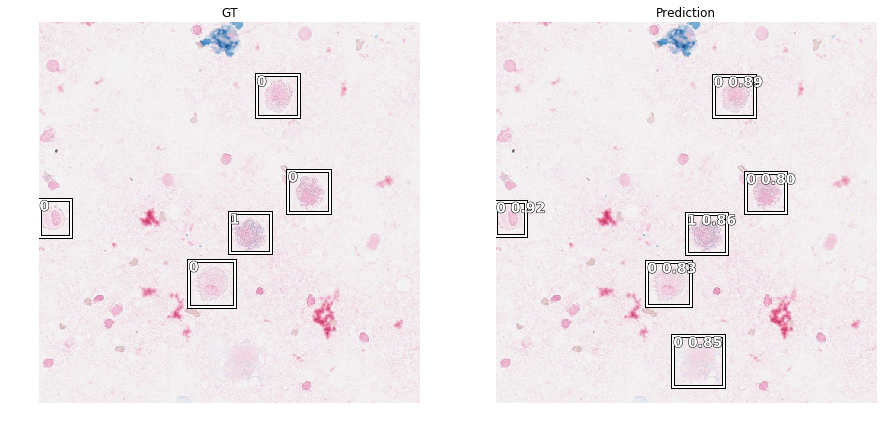

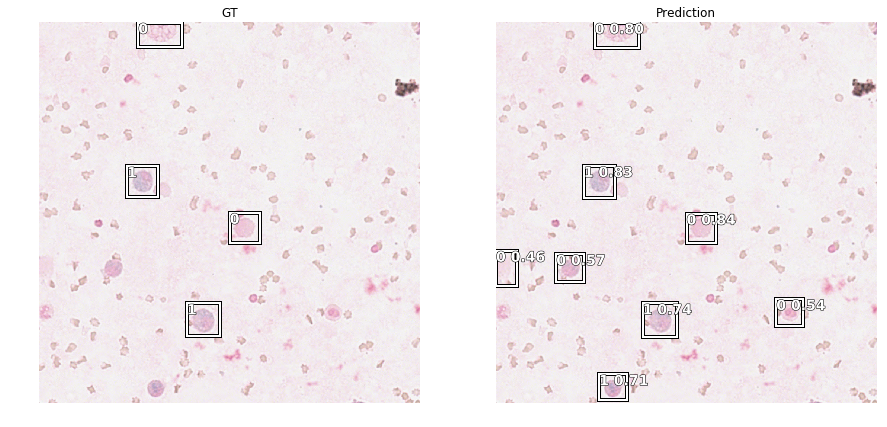

...

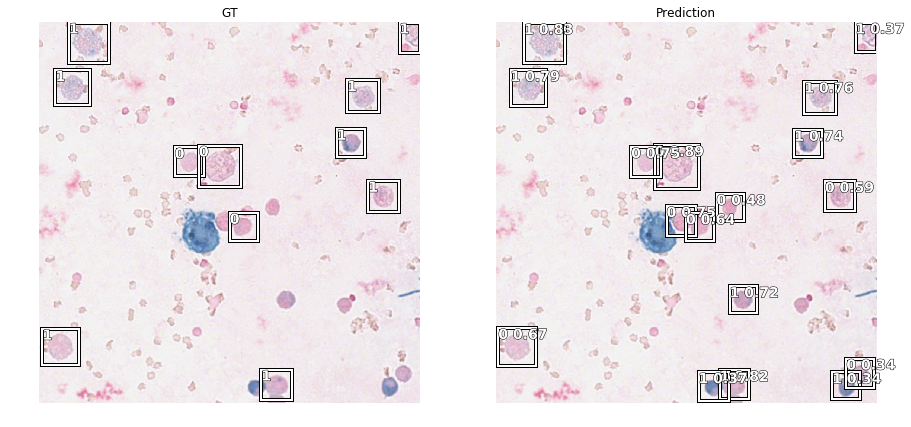

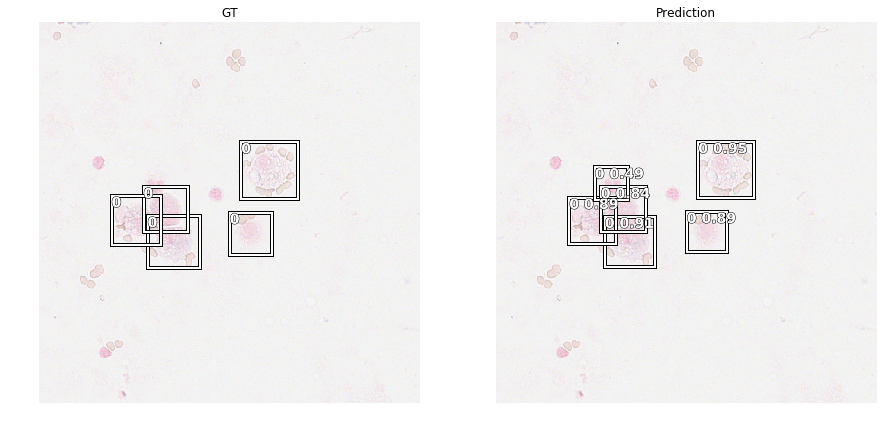

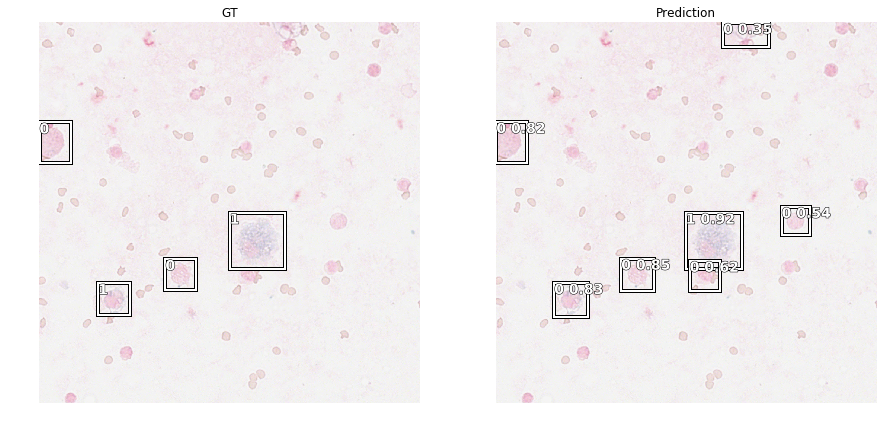

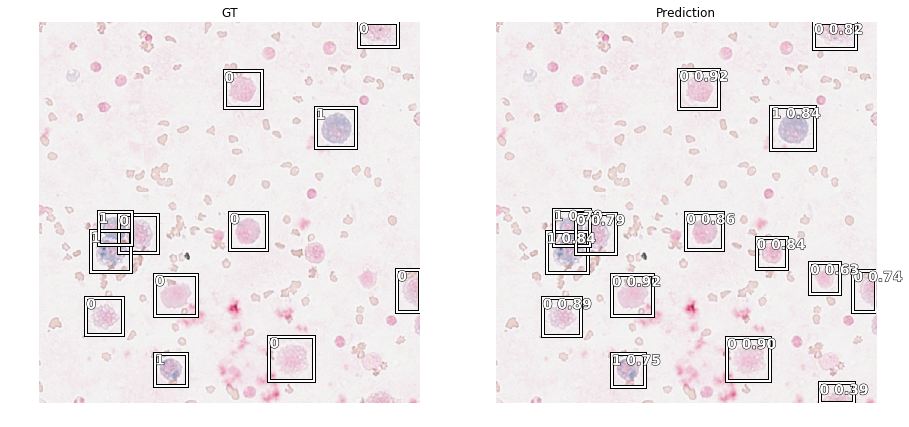

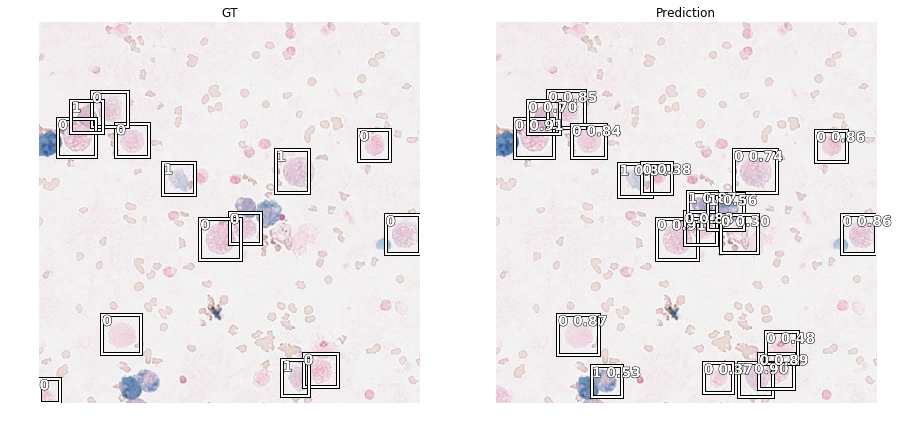

In [22]:
slide_object_result(learn, anchors, detect_thresh=0.3, nms_thresh=0.2, image_count=20)